# Loading

In [1]:
# Computational imports
import numpy as np   # Library for n-dimensional arrays
import pandas as pd  # Library for dataframes (structured data)

# Helper imports
import os 
import warnings
# import pandas_datareader as web
import datetime as dt

# ML/DL imports
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.layers import LSTM, Dense, Dropout, RepeatVector, TimeDistributed,GRU,Embedding
from sklearn.preprocessing import MinMaxScaler, OrdinalEncoder
from sklearn.metrics import mean_squared_error, mean_squared_log_error
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# Plotting imports
import matplotlib.pyplot as plt
import matplotlib.dates as dates
# import plotly.express as px
# import plotly.graph_objects as go
# import plotly.figure_factory as ff
# from plotly.subplots import make_subplots
# from plotly.offline import init_notebook_mode, iplot

# Set seeds to make the experiment more reproducible.
from numpy.random import seed
seed(1)

In [2]:
filepath='model2/'

In [3]:
df = pd.read_csv('df.csv')

In [4]:
data_oil = pd.read_csv('oil.csv')
data_oil['date']=pd.to_datetime(data_oil['date'])

In [5]:

train_data = pd.read_csv('train.csv', index_col=0)
test_data = pd.read_csv('test.csv', index_col=0)
data_oil = pd.read_csv('oil.csv')
samp_subm = pd.read_csv('sample_submission.csv')
data_holi = pd.read_csv('holidays_events.csv')
data_store =  pd.read_csv('stores.csv')
data_trans = pd.read_csv('transactions.csv')

C:\Users\User\AppData\Roaming\Python\Python37\site-packages\numpy\lib\arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [6]:
df_train1 = train_data.merge(data_holi, on = 'date', how='left')
df_train1 = df_train1.merge(data_oil, on = 'date', how='left')
df_train1 = df_train1.merge(data_store, on = 'store_nbr', how='left')

In [7]:
df_train1 = df_train1.rename(columns = {"type_x" : "holiday_type", "type_y" : "store_type"})

In [8]:
df = df_train1[['date','store_nbr','family','sales','onpromotion','holiday_type','locale','dcoilwtico','store_type','cluster']]

In [9]:
df['date'] =  pd.to_datetime(df['date'])
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['week'] = df['date'].dt.isocalendar().week
df['quarter'] = df['date'].dt.quarter
df['day_of_week'] = df['date'].dt.day_name()

C:\ProgramData\Anaconda3\envs\ProjectPy37\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\ProgramData\Anaconda3\envs\ProjectPy37\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\ProgramData\Anaconda3\envs\ProjectPy37\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index

In [10]:
df_copy = df.copy()

# EDA

In [11]:
df_draw = df[['date','sales']]

<AxesSubplot:xlabel='date'>

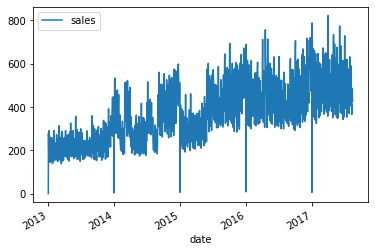

In [12]:
df_draw.groupby(['date'],as_index=True).agg({"sales":"mean"}).plot()


In [13]:
df_draw = df[['date','store_nbr','sales','family']]
buf = df_draw.groupby(['store_nbr','family','date'],as_index = False).agg({"sales":"mean"})


In [14]:
store = []
for i in range(1,55):
    f = list(buf[buf['store_nbr']==i].drop(columns = ['store_nbr']).groupby(['family']))
    store1 = f[0][1].drop(columns=['family'])
    for i in range(1,33):
        store1 = store1.merge(f[i][1].drop(columns=['family']), on = 'date', how='left')
        store1 = store1.rename(columns = {"sales_x": "sales" ,"sales_y" : f[i][0]})
    store1 = store1.rename(columns = {"sales": f[0][0]})  
    store.append(store1)


In [16]:
start_date,end_date = '2017-04-01','2017-08-15'

C:\ProgramData\Anaconda3\envs\ProjectPy37\lib\site-packages\pandas\plotting\_matplotlib\core.py:337: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


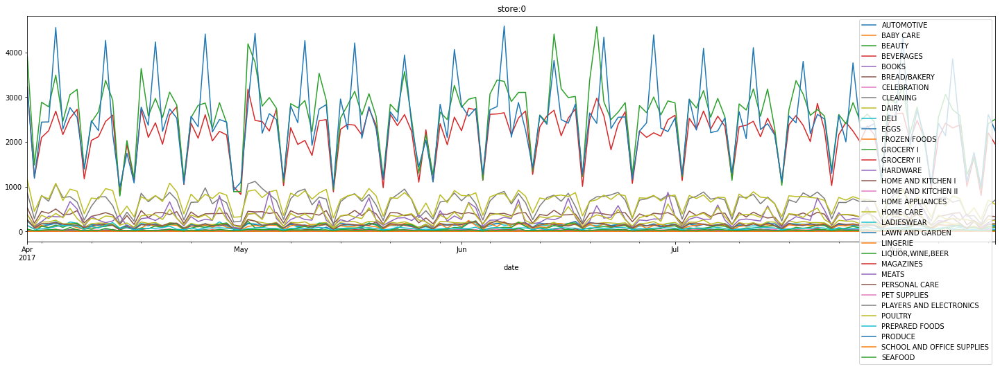

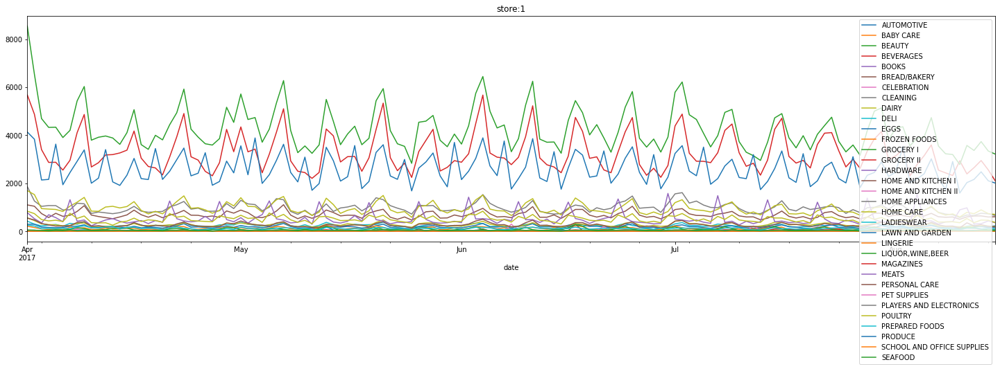

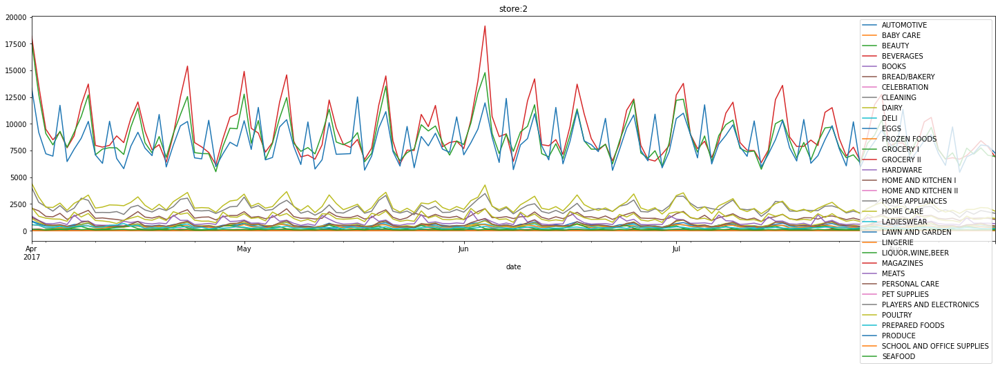

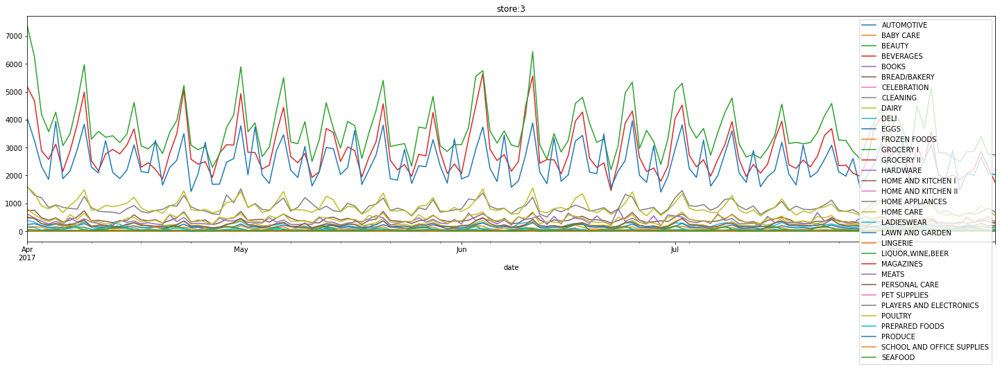

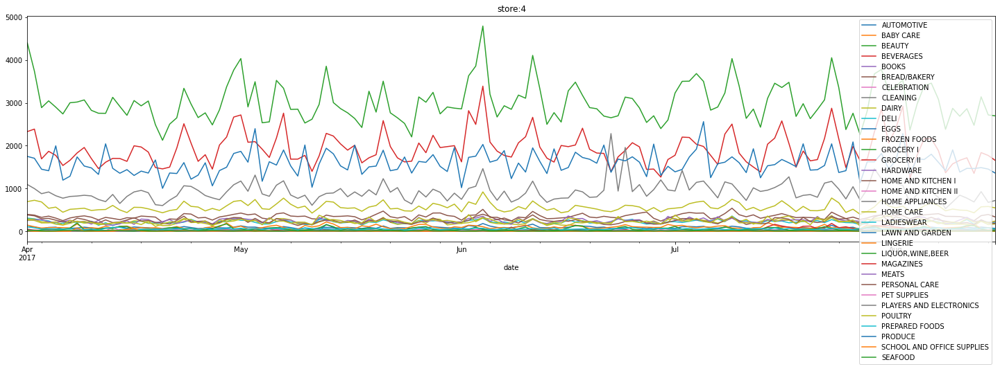

...

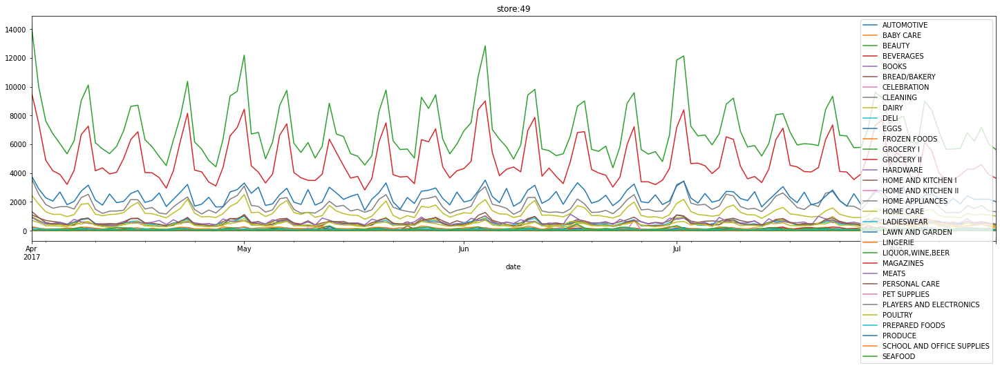

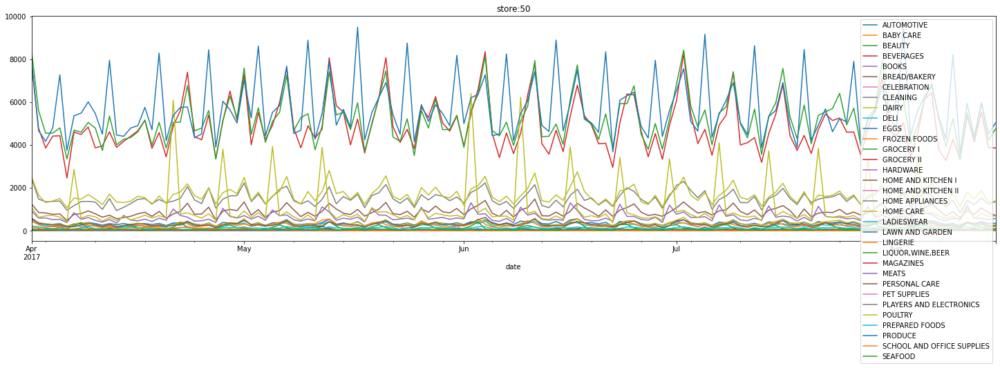

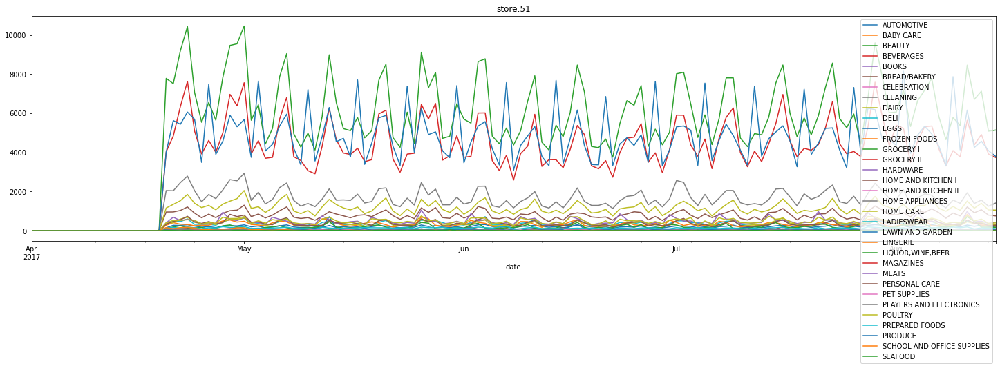

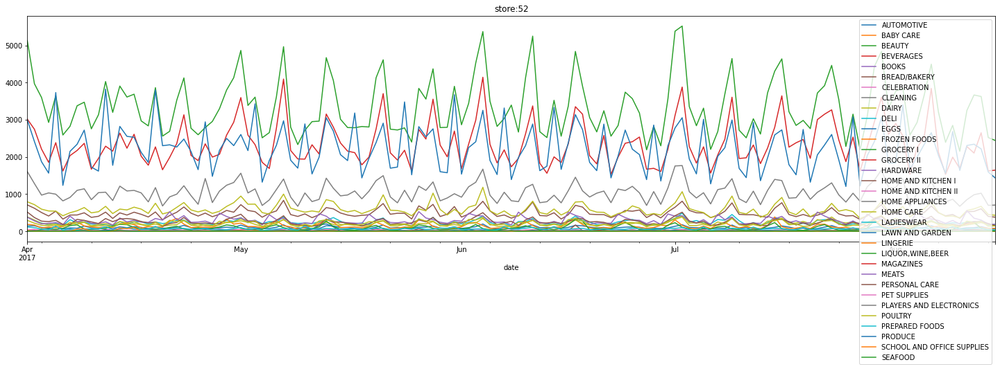

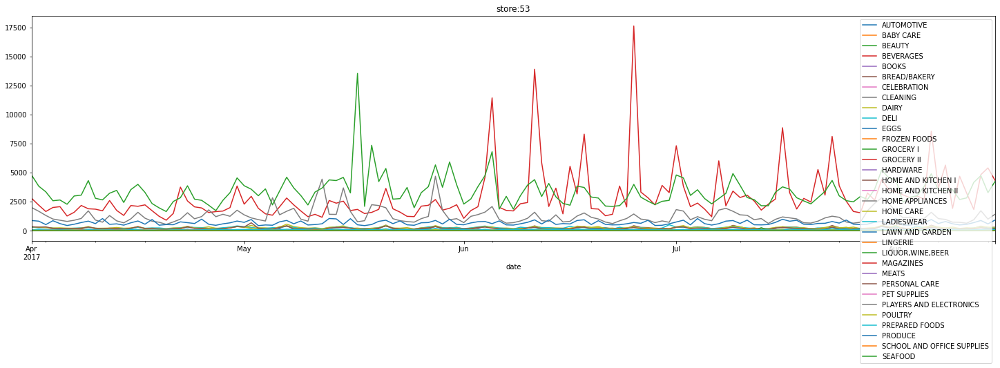

In [17]:
plt.rcParams["figure.figsize"] = (25, 6)
for i in range(len(store)):#len(store)):
    # print("store= ",i)
    store[i].set_index(store[i].date).drop(columns=['date']).iloc[0:,0:].loc[start_date:end_date].plot()
    plt.title('store:'+str(i))


In [106]:
# f = list(store[0].groupby(['family']))
# store1 = f[0][1].drop(columns=['family'])
# for i in range(1,33):
#     store1 = store1.merge(f[i][1].drop(columns=['family']), on = 'date', how='left')
#     store1 = store1.rename(columns = {"sales_x": "sales" ,"sales_y" : f[i][0]})
# store1 = store1.rename(columns = {"sales": f[0][0]})  


<AxesSubplot:xlabel='date'>

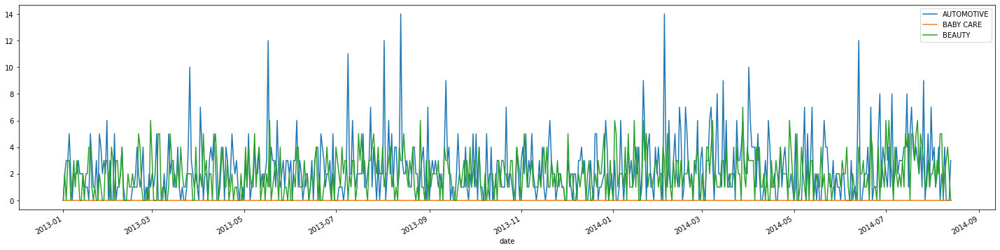

In [117]:
plt.rcParams["figure.figsize"] = (25, 6)
store1.set_index(store1.date).drop(columns=['date']).iloc[0:,0:3].plot()

In [125]:
# store1.info()
p = store1.describe()

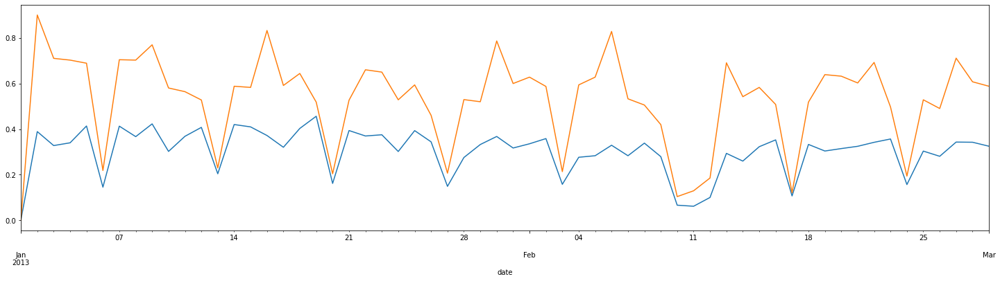

In [108]:
scaler = MinMaxScaler(feature_range=(0,1))
all_cols = ['BEVERAGES','CLEANING']
for col in all_cols:
    store1[col] = scaler.fit_transform(store1[col].values.reshape(-1,1))
    store1.set_index(store1.date).drop(columns=['date']).iloc[0:60,0:10][col].plot()

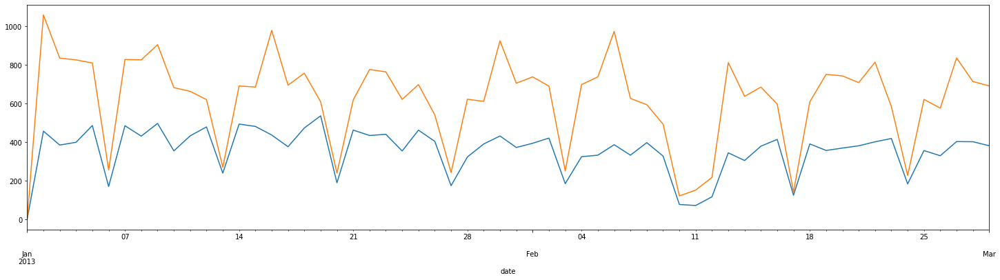

In [105]:
for col in all_cols:
    store1[col] = scaler.inverse_transform(store1[col].values.reshape(-1,1))
    store1.set_index(store1.date).drop(columns=['date']).iloc[0:60,0:10][col].plot()

In [ ]:
# Add holiday into train_data
holi_day = data_holi['date'][data_holi[['date']]['date'].between('2013-01-01','2017-08-31')]
df['date']=pd.to_datetime(df['date'])
df['holiday'] = df['date'].isin(holi_day).replace({True:1,False:0})

In [ ]:
data_day = df.drop_duplicates(['date']).reset_index(drop=True)


In [ ]:

a = [data_oil.index[data_oil['date']==day].tolist() for day in data_day['date']]

In [ ]:
b = [data_day.index[data_day['date']==day].tolist() for day in df['date']]

In [ ]:
data_oil.fillna(value=data_oil['dcoilwtico'].mean(),inplace=True)
df['oil']=data_oil['dcoilwtico'].mean()

In [ ]:
for day_index in range(len(df['oil'])):
    L = a[b[day_index][0]]
    if L!=[]:
        df['oil'][day_index] = data_oil['dcoilwtico'][L[0]]

In [ ]:
df.to_csv("df.csv",index=False,sep=',')

In [ ]:
object_cols = [cname for cname in df.columns if df[cname].dtype == "object" and cname != "date"]
num_cols = [cname for cname in df.columns if df[cname].dtype in ['int64', 'float64'] ]
all_cols = num_cols + object_cols
print(all_cols)

In [ ]:
ordinal_encoder = OrdinalEncoder()
df[object_cols] = ordinal_encoder.fit_transform(df[object_cols])

In [ ]:
x_train = df[:train_index].copy()
# y_train = df[:train_index].sales.copy()
x_train = x_train.groupby(['date']).agg({'store_nbr':'mean', 'family':'mean','onpromotion':'mean','holiday':'mean','oil':'mean','sales':'mean'})


In [ ]:

scaler = MinMaxScaler(feature_range=(0,1))
all_cols = ["holiday","oil","sales"]

for col in all_cols:
    x_train[col] = scaler.fit_transform(x_train[col].values.reshape(-1,1))
y_train = x_train['sales']
x_train = x_train.drop(columns=['sales'])

In [ ]:
history_input = 30
x_train_input = []
y_train_input = []
for i in range(len(x_train)-history_input+1):
    x_train_input.append(x_train[i:i+history_input].values)
    y_train_input.append(y_train.iloc[i+history_input-1])
x_train_input=np.array(x_train_input)
y_train_input=np.array(y_train_input)
# print(x_train_input.shape)
# print(y_train_input.shape)

In [ ]:
# def Make_Model_GRU():
#     model = Sequential()
#     model.add(Embedding(3800,32,input_length=380))
#     model.add(Dropout(0.2))
#     model.add(GRU(32))
    
    
    

In [ ]:
def Multi_Step_LSTM_model():
    
    # Use Keras sequential model
    model = Sequential()    
    
    # First LSTM layer with Dropout regularisation; Set return_sequences to True to feed outputs to next layer
    model.add(LSTM(units = 50, activation='relu', return_sequences = True, input_shape = x_train_input[0].shape )) 
    model.add(Dropout(0.2))
    
    # Second LSTM layer with Dropout regularisation; Set return_sequences to True to feed outputs to next layer
    model.add(LSTM(units = 50,  activation='relu', return_sequences = True))                                    
    model.add(Dropout(0.2))
    
    # Final LSTM layer with Dropout regularisation; Set return_sequences to False since now we will be predicting with the output layer
    model.add(LSTM(units = 50))
    model.add(Dropout(0.2))
    
    # The output layer with linear activation to predict Open stock price
    model.add(Dense(units=1, activation = "linear"))
    
    return model

In [ ]:
model = Multi_Step_LSTM_model()
model.summary()
model.compile(optimizer='adam', loss='mean_squared_error', metrics = ['accuracy'])

In [ ]:
history = model.fit(x_train_input,y_train_input, validation_split=0.3,batch_size=len(x_train_input), epochs=100)

In [ ]:
def draw(history):
    val_acc = np.mean(history.history['val_accuracy'])
    print("\n%s: %.2f%%" % ('val_acc', val_acc*100))
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation','train_loss','val_loss'], loc='upper left')

    # plt.legend(['train','loss'], loc='upper left')
    plt.show()

In [ ]:
draw(history)
## Perdict

In [ ]:
# serialize model to JSON
model_json = model.to_json()
with open(filepath+"model.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights(filepath+"model.json.h5")
print("Saved model to disk")

In [ ]:
x_test_mean = df[train_index:].copy()
x_test_mean = x_test_mean.drop(columns=['sales'])

In [ ]:
x_test_mean = x_test_mean.groupby(['date'],as_index=False).agg({'store_nbr':'mean', 'family':'mean','onpromotion':'mean','holiday':'mean','oil':'mean'})

In [ ]:
x_test_mean = pd.concat([x_train[-30:-1],x_test_mean],ignore_index=True)

In [ ]:
x_test = df[train_index:].copy()
# print(x_test_mean.keys)
# print(pd.concat([x_test_mean[0:29],x_test[0:1]]))
# print(x_test.iloc[0:1])

In [ ]:
x_test = df[train_index:].copy()
x_test_input = []
for i in range(len(x_test['date'])):
    end = x_test_mean.index[x_test_mean['date']==x_test['date'].iloc[i]].tolist()[0]
    start = end - 29
    x_test_input.append(pd.concat([x_test_mean[start:end].drop(columns=["date"]),x_test[i:i+1].drop(columns=["date","sales"])]).values)
    # print(start,end)
    # if i==28511:
    #     print(x_test_mean[start:end].drop(columns=["date"]),x_test[i:i+1].drop(columns=["date","sales"]))
   
x_test_input=np.array(x_test_input)
print(x_test_input.shape)

In [ ]:
# x_test_input = x_test_input.
# x_test_input = np.asarray(x_test_input).astype(np.float32)
y_pred = model.predict(x_test_input)
print(y_pred)

In [ ]:
y_pred = scaler.inverse_transform(y_pred)
print(y_pred)

In [ ]:
test_data = pd.read_csv('test.csv')
submit = test_data[['id']]
submit['sales'] = y_pred
# print(test_data[['id']])

In [ ]:
submit.to_csv(filepath+"submit.csv",index=False,sep=',')
import zipfile
with zipfile.ZipFile(filepath+'submit.zip', 'w') as zf:
    zf.write(filepath+'submit.csv')